In [1]:
import numpy as np
from numpy.linalg import eigvals
import matplotlib.pyplot as plt

from matplotlib import cm
from matplotlib.colors import LogNorm
from matplotlib.animation import FuncAnimation as FA

plt.rc("font", family="serif", size=16)
plt.rc("mathtext", fontset="cm")
plt.rc("lines", lw=2)

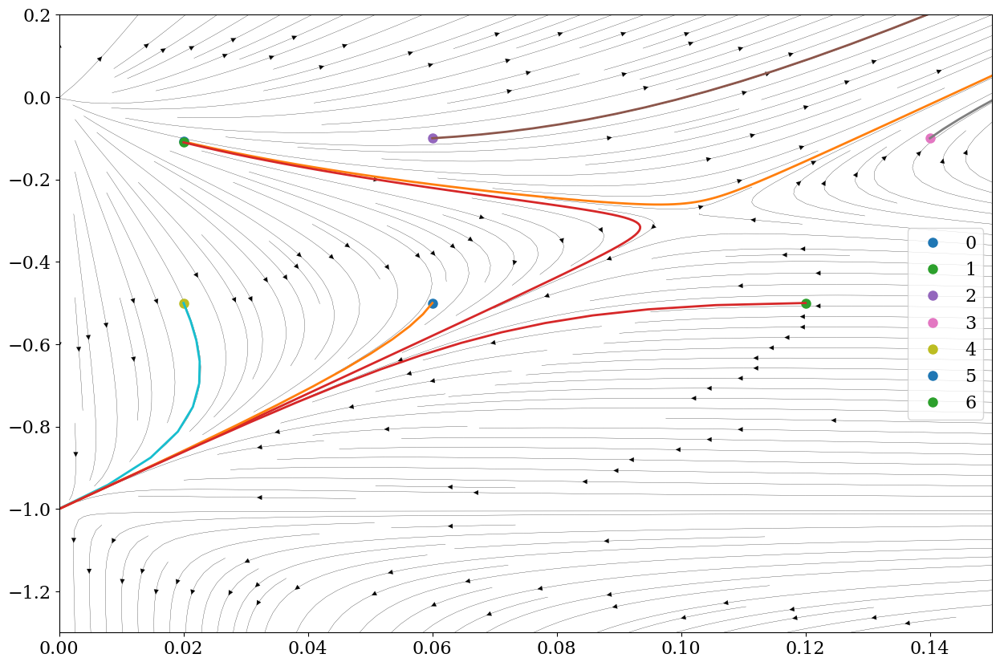

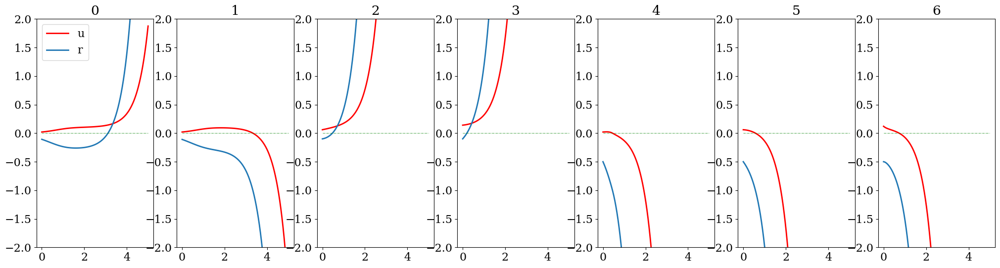

In [6]:
N = 2
e = 2
br = lambda u, r: 2*r + u * (N + 2) / (1 + r)
bu = lambda u, r: ( e - u * (N + 8)/(1 + r)**2 ) * u

m = 200
u = np.linspace(0, .15, m)
r = np.linspace(-1.3, .2, m)
u, r = np.meshgrid(u, r)

fig, ax = plt.subplots(figsize=(15, 10))
v, w = bu(u, r), br(u, r)
ax.streamplot(u, r, v, w, density=2., linewidth=.2, color='k')

lim = 2.

rs = np.array([-.108, -.11, -.1, -.1, -.5, -.5, -.5])
us = np.array([.02, .02, .06, .14, .02, .06, .12])


from scipy.integrate import odeint
fig2, ax2 = plt.subplots(1, len(rs), figsize=(25, 6)) 
for i in range(len(rs)):
    u0 = us[i]
    r0 = rs[i]
    ax.plot(u0, r0, 'o', label=str(i), ms=8)

    y0 = [u0, r0]
    f = lambda y, t : np.array([bu(*y), br(*y)])

    l = np.linspace(0, 5, 100)
    sol = odeint(f, y0, l)
    ax2[i].plot(l, sol[:, 0], 'r', label="u")
    ax2[i].plot(l, sol[:, 1], 'tab:blue', label="r")
    ax2[i].set_title(str(i))
    ax2[i].plot(l, np.zeros_like(l), 'g-.', lw=.5) 
    
    ax.plot(sol[:, 0], sol[:, 1])

[axi.set_ylim(-2, 2) for axi in ax2]

ax.set_xlim(np.min(u), np.max(u))
ax.set_ylim(np.min(r), np.max(r))

ax.legend()
ax2[0].legend()
plt.show()

plt.show()

In [7]:
N = 2

S = lambda r : 1 + r
fr = lambda r, x : -( (N + 2)*S(r)**3 + 8*(N + 2)*S(r)**2*x + 3*(7*N + 6)*S(r)*x**2 + 18*N*x**3 ) / ( (S(r) + x)**2 * (S(r) + 3*x)**2 )
fx = lambda r, x : ( (N + 8)*S(r)**2 + 6*(N + 2)*S(r)*x + 9*N*x**2 ) / ( (S(r) + x)**2 * (S(r) + 3*x)**2 )

In [8]:
br = lambda u, r, x: 2*r - u * fr(r, x)
bx = lambda u, r, x: ( 2 - u * fx(r, x) ) * x
bue = lambda e, u, r, x:  ( e - u * fx(r, x) ) * u

/tmp/ipykernel_2257164/3929079855.py:22: UserWarning: The following kwargs were not used by contour: 'lw'
  ax.contour(u, r, bu(u, r, x), [0,], colors='k', linestyles="dashed", lw=1)


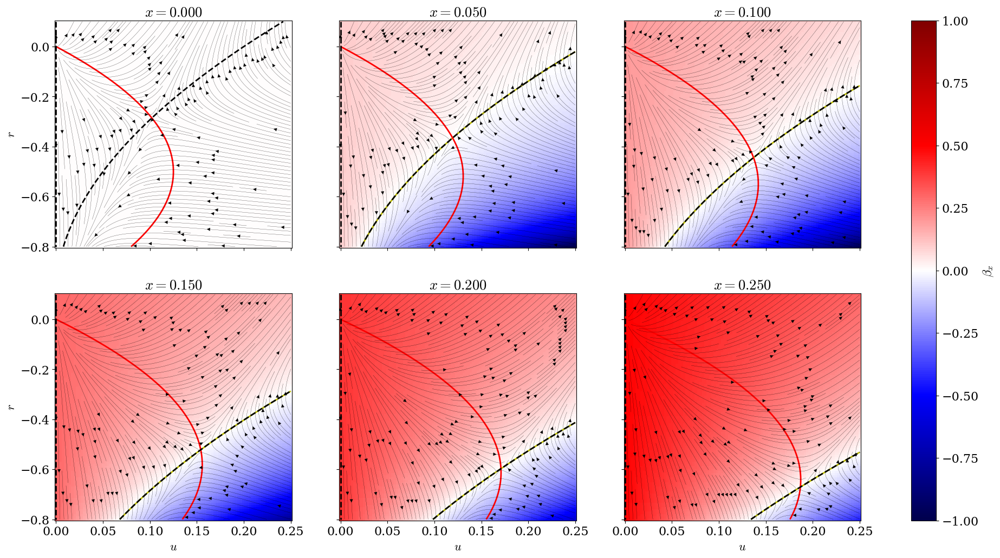

In [11]:
e = 2
bu = lambda u, r, x : bue(e, u, r, x)

n = 6
xs = np.linspace(0, .25, n)

m = 100
u = np.linspace(0, .25, m)
r = np.linspace(-.8, .1, m)

u, r = np.meshgrid(u, r)

lim = 1.

fig, axs = plt.subplots(2,3,figsize=(24, 12), sharex=True, sharey=True) 

for i, x in enumerate(xs):
    ax = axs[i//3, i%3]
    pc = ax.pcolor(u, r, bx(u, r, x), vmax=lim, vmin=-lim, cmap=cm.seismic)
    ax.contour(u, r, bx(u, r, x), [0,], colors='y')
    ax.contour(u, r, br(u, r, x), [0,], colors='r')
    ax.contour(u, r, bu(u, r, x), [0,], colors='k', linestyles="dashed", lw=1) 
    ax.streamplot(u, r, bu(u, r, x), br(u, r, x), density=2., linewidth=.2, color='k')

    ax.set_title("$x = {x:.3f}$".format(x=x))
    if i%3==0: ax.set_ylabel("$r$")
    if i//3==1: ax.set_xlabel("$u$")

fig.colorbar(pc, ax=axs, label="$\\beta_x$")
plt.show()

/home/mjohnsrud/anaconda3/lib/python3.11/site-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


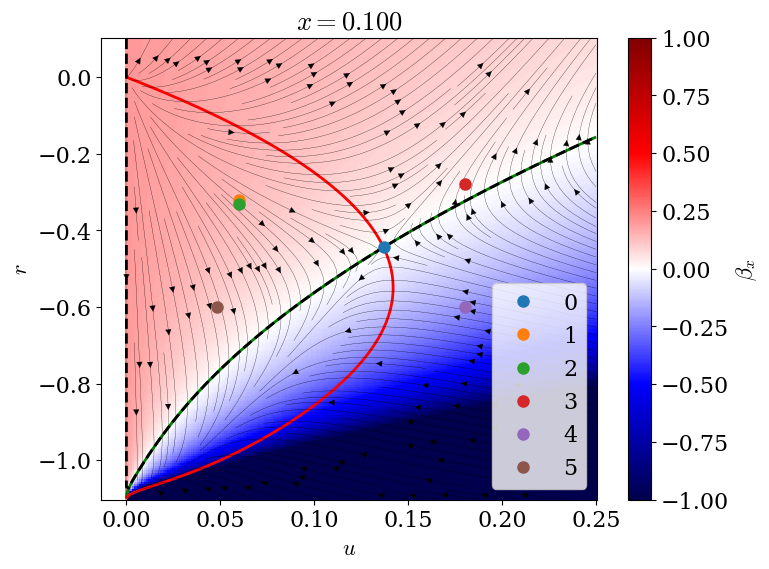

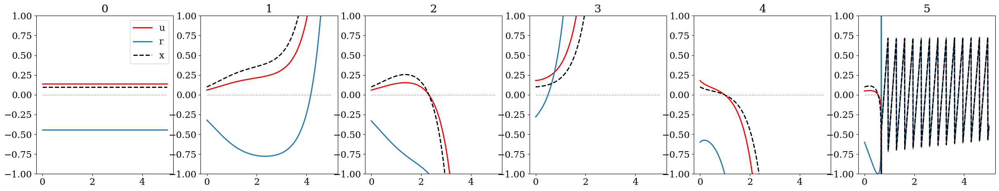

In [12]:
e = 2
bu = lambda u, r, x : bue(e, u, r, x)
x = .1

m = 200
u = np.linspace(0, .25, m)
r = np.linspace(-1.1, .1, m)

u, r = np.meshgrid(u, r)

lim = 1.

fig, ax = plt.subplots(figsize=(8, 6)) 

pc = ax.pcolor(u, r, bx(u, r, x), vmax=lim, vmin=-lim, cmap=cm.seismic)
ax.contour(u, r, bx(u, r, x), [0,], colors='g')
ax.contour(u, r, br(u, r, x), [0,], colors='r')
ax.contour(u, r, bu(u, r, x), [0,], colors='k', linestyles="dashed") 
ax.streamplot(u, r, bu(u, r, x), br(u, r, x), density=2., linewidth=.2, color='k')
ax.set_title("$x = {x:.3f}$".format(x=x))
ax.set_ylabel("$r$")
ax.set_xlabel("$u$") 
fig.colorbar(pc, ax=ax, label="$\\beta_x$")


from scipy.optimize import fsolve as solve

f = lambda v : np.array([bu(v[0], v[1], x), br(v[0], v[1], x)])
x0 = [.12, -.5] # eyball
uS, rS = solve(f, x0)

rs = np.array([rS,-.32, -.33, -.28, -.6, -.6])
us = np.array([uS, .06, .06, .18, .18, .048])


from scipy.integrate import odeint
fig2, ax2 = plt.subplots(1, len(rs), figsize=(30, 5)) 
for i in range(len(rs)):
    u0 = us[i]
    r0 = rs[i]
    ax.plot(u0, r0, 'o', label=str(i), ms=8)

    y0 = [u0, r0, x]
    # y = u, r, t
    f = lambda y, t : np.array([bu(*y), br(*y), bx(*y)])

    l = np.linspace(0, 5, 1000)
    sol = odeint(f, y0, l)
    ax2[i].plot(l, sol[:, 0], 'r', label="u")
    ax2[i].plot(l, sol[:, 1], 'tab:blue', label="r")
    ax2[i].plot(l, sol[:, 2], 'k--',label="x")
    ax2[i].set_title(str(i))
    ax2[i].plot(l, np.zeros_like(l), 'g-.', lw=.5) 

[axi.set_ylim(-1, 1) for axi in ax2]


ax.legend()
ax2[0].legend()
plt.show()

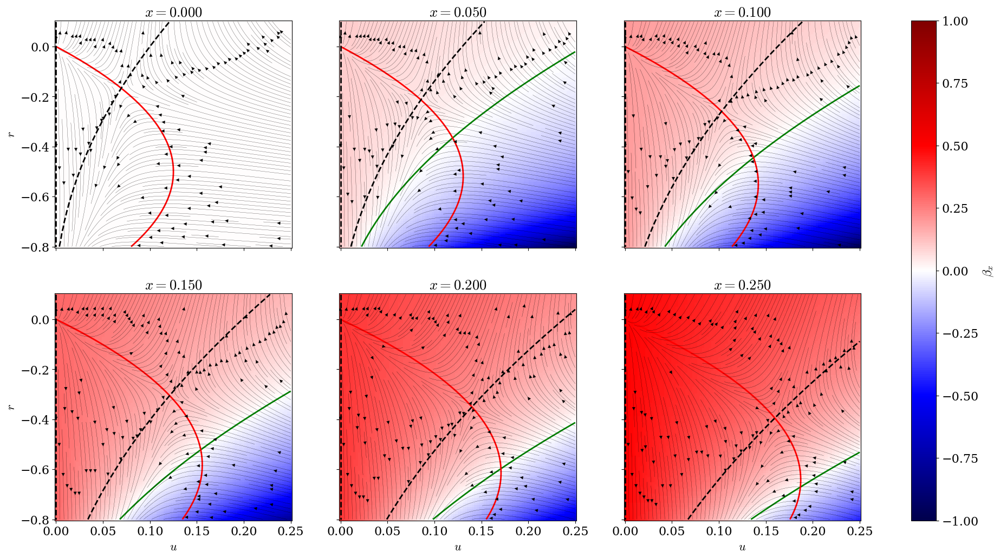

In [ ]:
e = 1
bu = lambda u, r, x : bue(e, u, r, x)

n = 6
xs = np.linspace(0, .25, n)

m = 100
u = np.linspace(0, .25, m)
r = np.linspace(-.8, .1, m)

u, r = np.meshgrid(u, r)

lim = 1.

fig, axs = plt.subplots(2,3,figsize=(24, 12), sharex=True, sharey=True) 

for i, x in enumerate(xs):
    ax = axs[i//3, i%3]
    pc = ax.pcolor(u, r, bx(u, r, x), vmax=lim, vmin=-lim, cmap=cm.seismic)
    ax.contour(u, r, bx(u, r, x), [0,], colors='g')
    ax.contour(u, r, br(u, r, x), [0,], colors='r')
    ax.contour(u, r, bu(u, r, x), [0,], colors='k', linestyles="dashed") 
    ax.streamplot(u, r, bu(u, r, x), br(u, r, x), density=2., linewidth=.2, color='k')

    ax.set_title("$x = {x:.3f}$".format(x=x))
    if i%3==0: ax.set_ylabel("$r$")
    if i//3==1: ax.set_xlabel("$u$")

fig.colorbar(pc, ax=axs, label="$\\beta_x$")
plt.show()

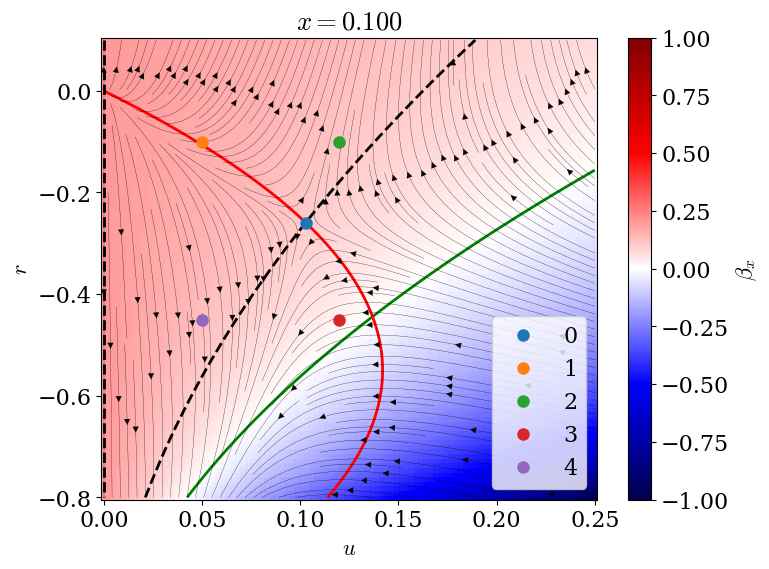

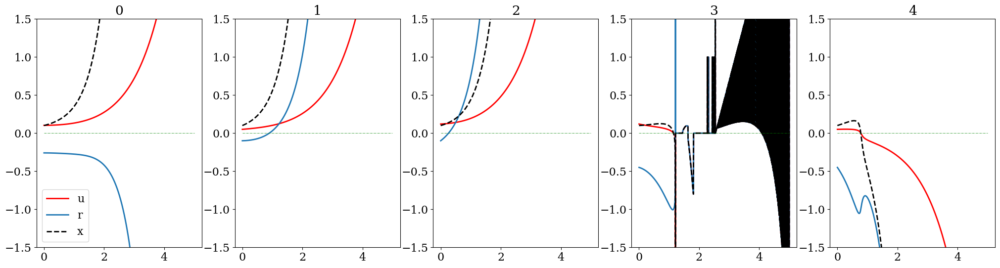

In [ ]:
e = 1
bu = lambda u, r, x : bue(e, u, r, x)
x = .1

m = 100
u = np.linspace(0, .25, m)
r = np.linspace(-.8, .1, m)

u, r = np.meshgrid(u, r)

lim = 1.

fig, ax = plt.subplots(figsize=(8, 6)) 

pc = ax.pcolor(u, r, bx(u, r, x), vmax=lim, vmin=-lim, cmap=cm.seismic)
ax.contour(u, r, bx(u, r, x), [0,], colors='g')
ax.contour(u, r, br(u, r, x), [0,], colors='r')
ax.contour(u, r, bu(u, r, x), [0,], colors='k', linestyles="dashed") 
ax.streamplot(u, r, bu(u, r, x), br(u, r, x), density=2., linewidth=.2, color='k')
ax.set_title("$x = {x:.3f}$".format(x=x))
ax.set_ylabel("$r$")
ax.set_xlabel("$u$") 
fig.colorbar(pc, ax=ax, label="$\\beta_x$")


from scipy.optimize import fsolve as solve

f = lambda v : np.array([bu(v[0], v[1], x), br(v[0], v[1], x)])
x0 = [.12, -.5] # eyball
uS, rS = solve(f, x0)

rs = np.array([rS, -.1, -.1, -.45, -.45])
us = np.array([uS, .05, .12, .12, .05])


from scipy.integrate import odeint
fig2, ax2 = plt.subplots(1, len(rs), figsize=(25, 6)) 
for i in range(len(rs)):
    u0 = us[i] 
    r0 = rs[i]
    ax.plot(u0, r0, 'o', label=str(i), ms=8)

    y0 = [u0, r0, x]
    # y = u, r, t
    f = lambda y, t : np.array([bu(*y), br(*y), bx(*y)])

    l = np.linspace(0, 5, 1000)
    sol = odeint(f, y0, l)
    ax2[i].plot(l, sol[:, 0], 'r', label="u")
    ax2[i].plot(l, sol[:, 1], 'tab:blue', label="r")
    ax2[i].plot(l, sol[:, 2], 'k--',label="x")
    ax2[i].plot(l, np.zeros_like(l), 'g-.', lw=.5) 
    ax2[i].set_title(str(i))


[axi.set_ylim(-1.5, 1.5) for axi in ax2]
ax.legend()
ax2[0].legend()
plt.show()

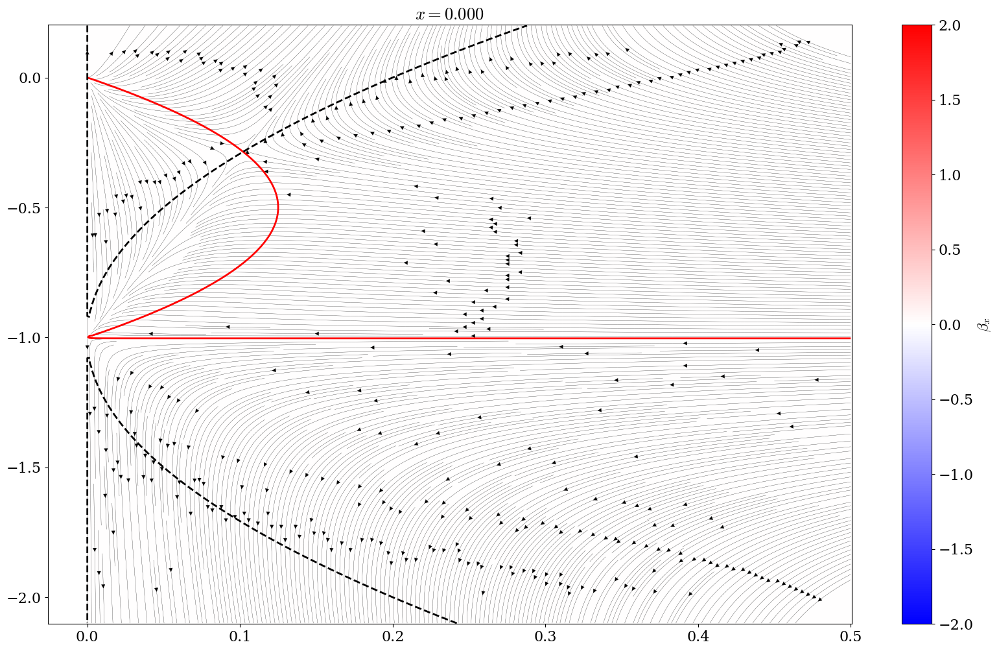

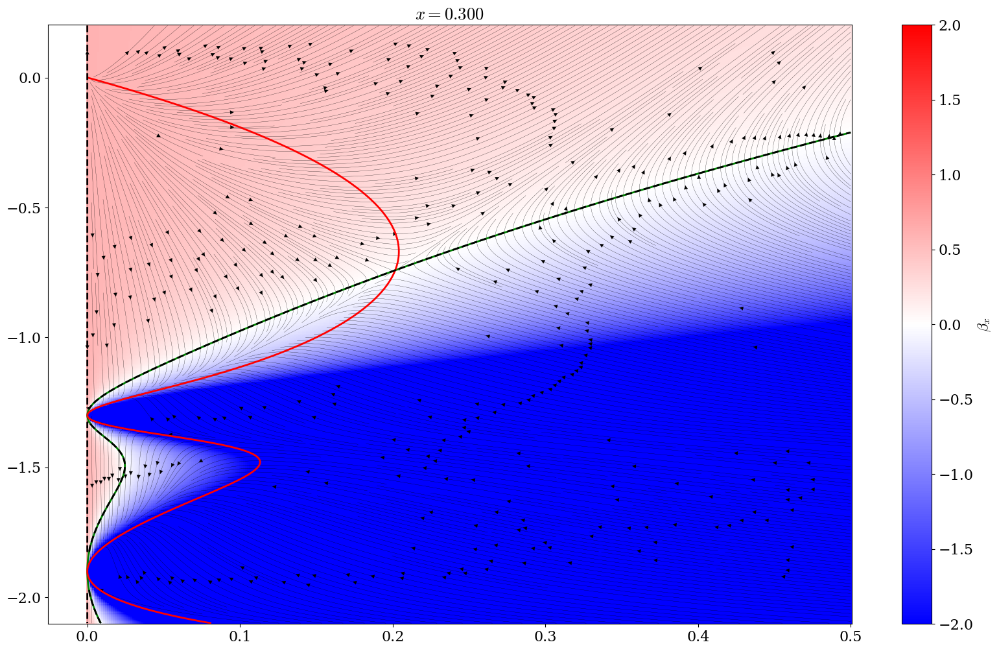

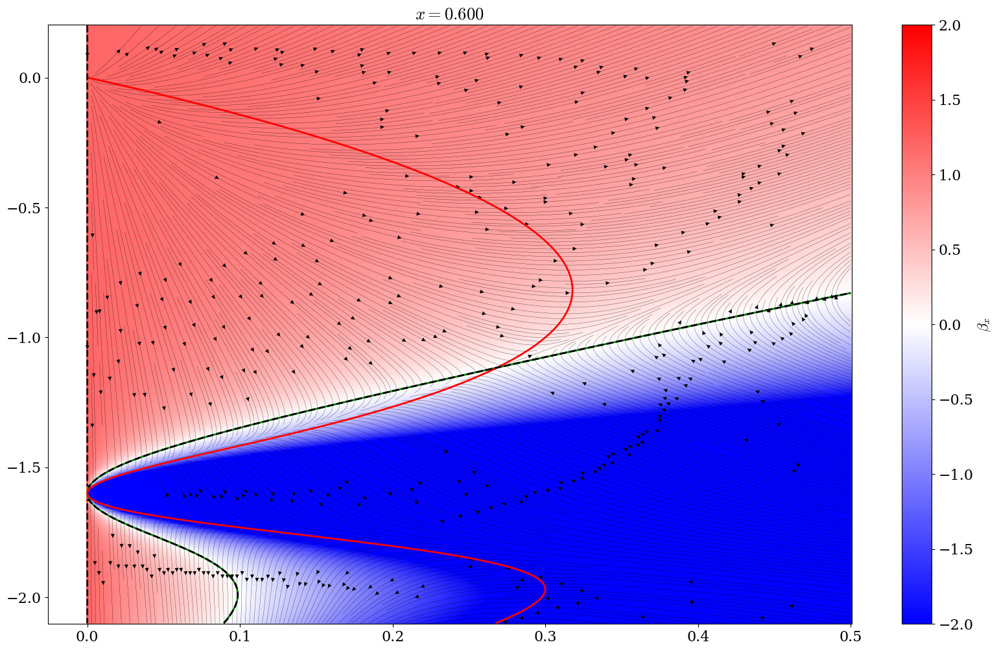

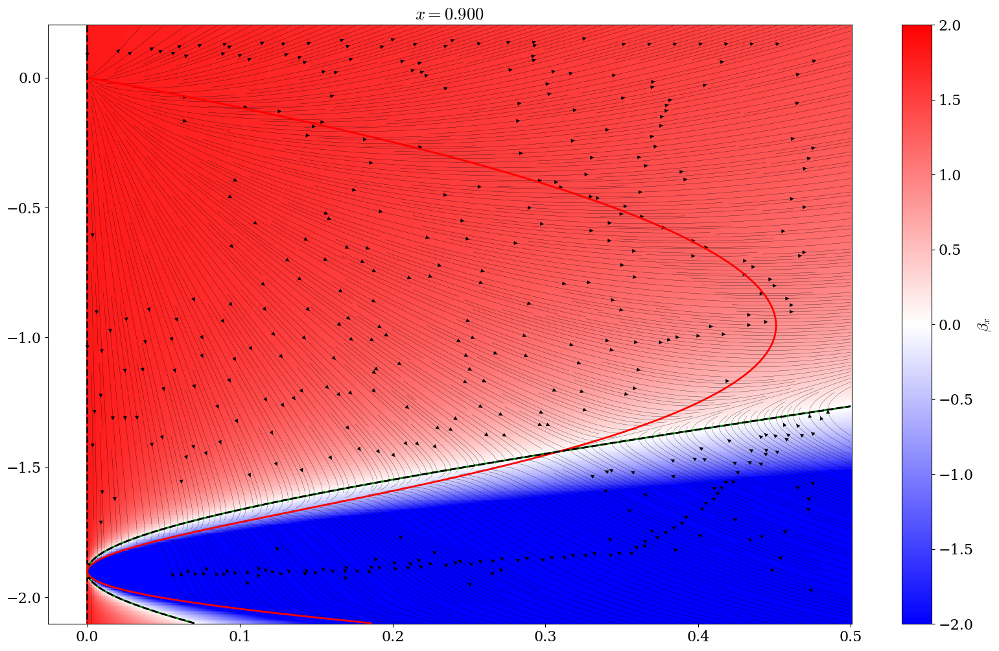

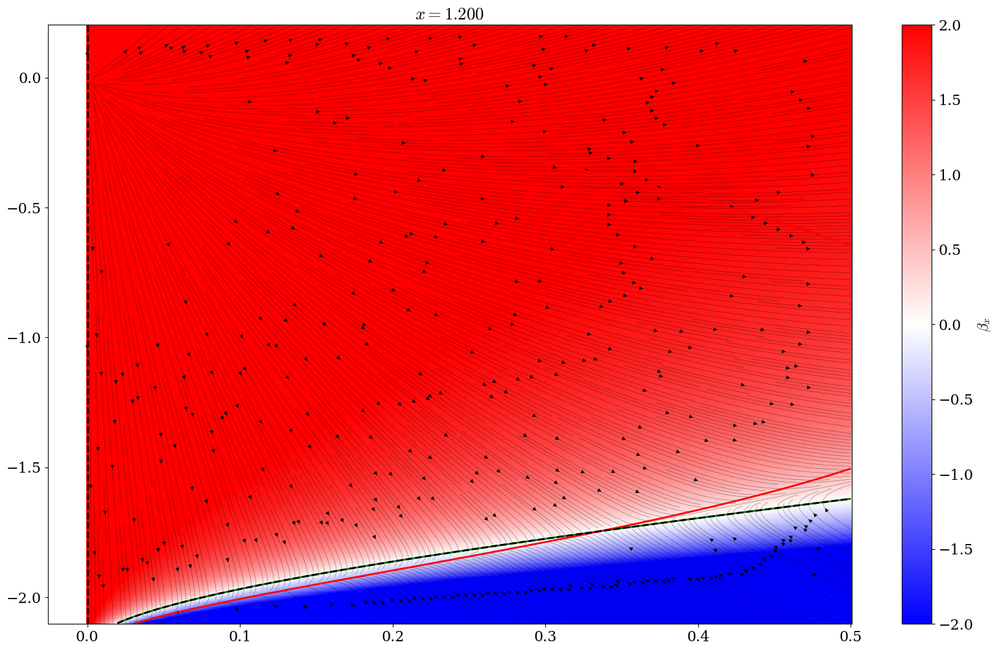

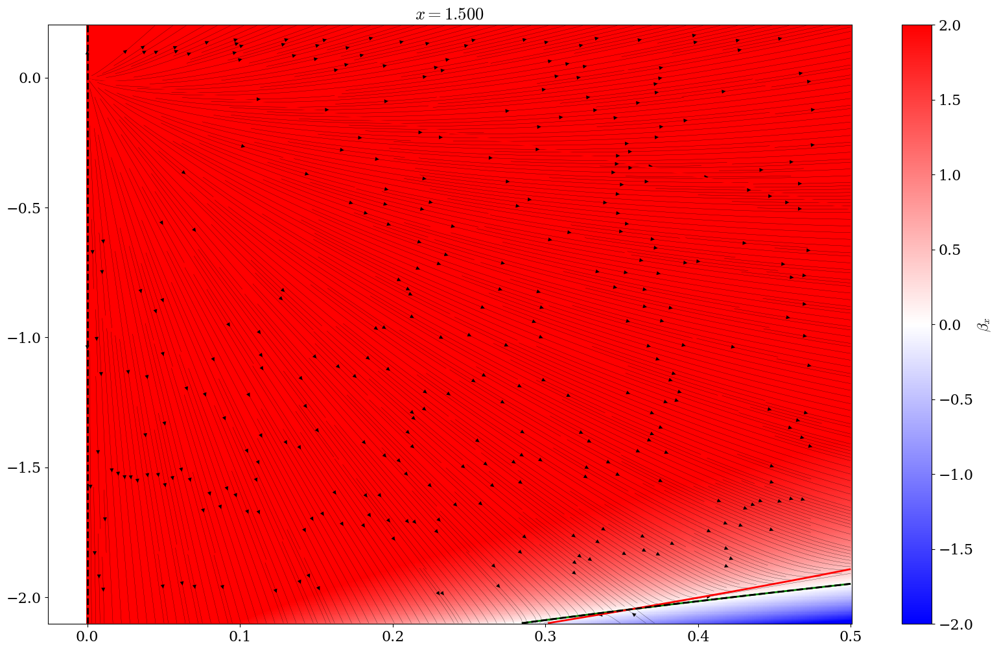

In [ ]:
e = 2

n = 6
xs = np.linspace(0, 1.5, n)

m = 400
u = np.linspace(0, .5, m)
r = np.linspace(-2.1, .2, m)

u, r = np.meshgrid(u, r)

for i, x in enumerate(xs):
    fig, ax = plt.subplots(figsize=(20, 12))
    pc = ax.pcolor(u, r, bx(u, r, x), vmax=2, vmin=-2, cmap=cm.bwr)
    cb = fig.colorbar(pc, label="$\\beta_x$")
    ax.streamplot(u, r, bue(e, u, r, x), br(u, r, x), density=6., linewidth=.2, color='k')
    ax.contour(u, r, bx(u, r, x), [0,], colors='g')
    ax.contour(u, r, br(u, r, x), [0,], colors='r')
    ax.contour(u, r, bue(e, u, r, x), [0,], colors='k', linestyles="dashed") 

    ax.set_title("$x = {x:.3f}$".format(x=x))
    plt.show()

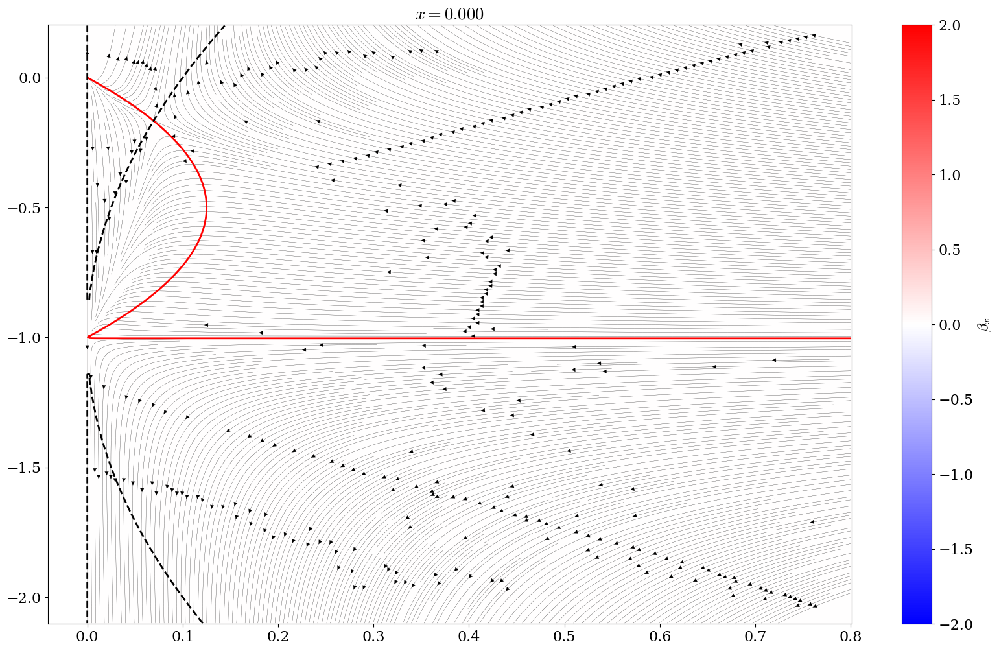

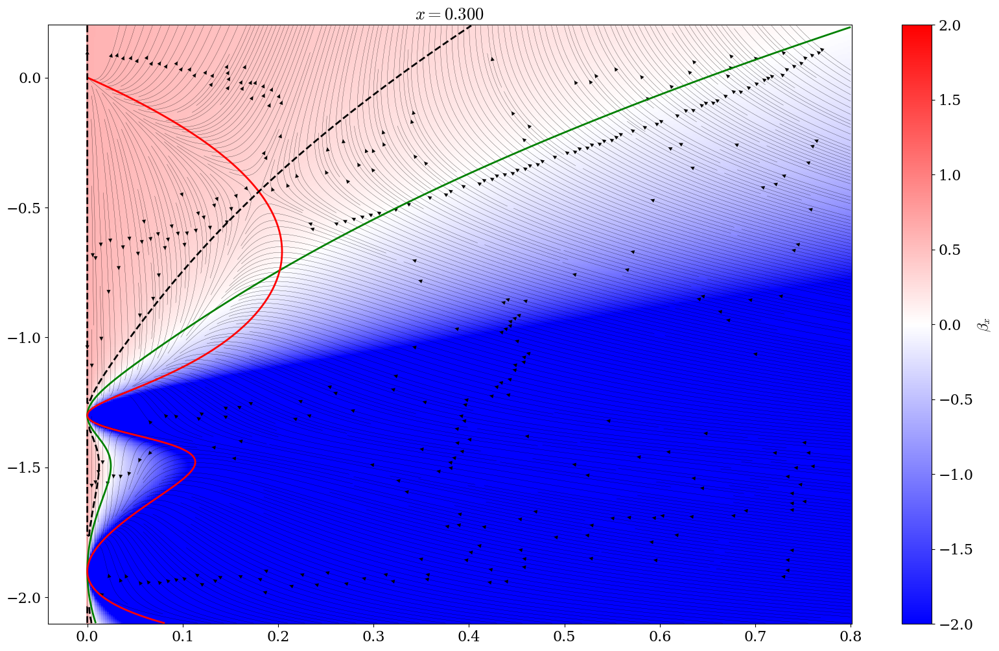

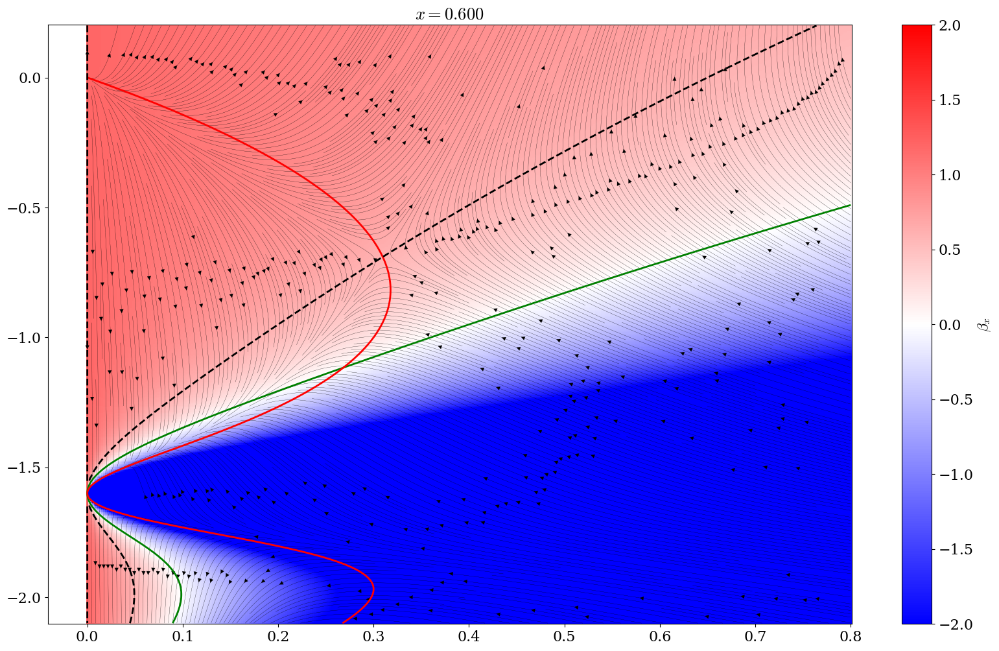

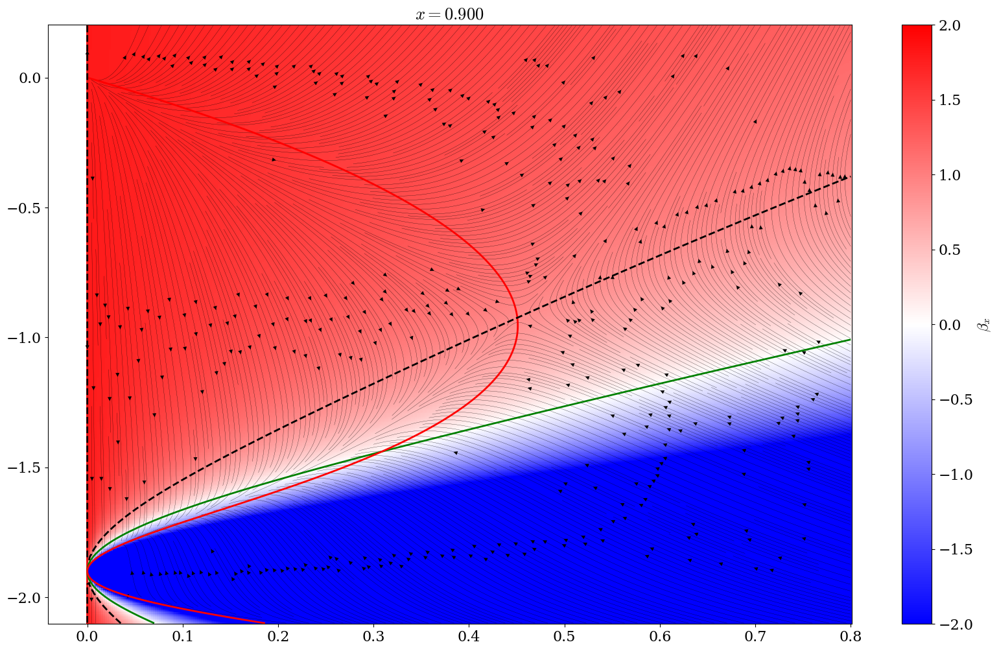

In [ ]:
e = 1

n = 6
xs = np.linspace(0, 1.5, n)

m = 400
u = np.linspace(0, .8, m)
r = np.linspace(-2.1, .2, m)

u, r = np.meshgrid(u, r)

for i, x in enumerate(xs):
    fig, ax = plt.subplots(figsize=(20, 12))
    pc = ax.pcolor(u, r, bx(u, r, x), vmax=2, vmin=-2, cmap=cm.bwr)
    cb = fig.colorbar(pc, label="$\\beta_x$")
    ax.streamplot(u, r, bue(e, u, r, x), br(u, r, x), density=6., linewidth=.2, color='k')
    ax.contour(u, r, bx(u, r, x), [0,], colors='g')
    ax.contour(u, r, br(u, r, x), [0,], colors='r')
    ax.contour(u, r, bue(e, u, r, x), [0,], colors='k', linestyles="dashed") 

    ax.set_title("$x = {x:.3f}$".format(x=x))
    plt.show()